# Enoncé

Le cancer du sein est le cancer le plus fréquent chez les femmes et l'une des principales causes de décès chez les femmes dans le monde. Chaque année, environ 124 femmes sur 100 000 reçoivent un diagnostic de cancer du sein, et l'on estime que 23 femmes sur 124 mourront de cette maladie. Lorsqu'il est détecté à un stade précoce, il y a 30 % de chances que le cancer puisse être traité efficacement, mais la détection tardive des tumeurs à un stade avancé rend le traitement plus difficile.

Actuellement, les techniques les plus utilisées pour détecter le cancer du sein à un stade précoce sont : la mammographie (63 à 97 % d'exactitude), la FNA (Fine Needle Aspiration) avec interprétation visuelle (65 à 98 % d'exactitude) et la biopsie chirurgicale (environ 100 % d'exactitude). Par conséquent, la mammographie et la FNA avec exactitude de l'interprétation visuelle varient considérablement et la biopsie chirurgicale, bien que fiable, est invasive et coûteuse.

Le dataset que vous avez inclut différentes types de données extraits à partir d'images numérisées d'une aspiration à l'aiguille fine (FNA) d'une masse mammaire. Ils décrivent les caractéristiques des noyaux cellulaires présents dans l'image. Quelques-unes des images peuvent être trouvées sur http://pages.cs.wisc.edu/~olvi/uwmp/cancer.html

## Instructions

* Créer votre propre notebook (soit dans votre machine, soit dans une session myBinder).
* Importer les données
* Vérifier si les données sont "propres" et les types
* Faire la séparation des données en deux groupes (train et test, vous pouvez tester différents ratios)
* Utiliser différentes méthodes de classification afin d'obtenir la meilleure précision possible pour classer les cas en Bénigne (B) ou Maligne (M)
* Faire aussi une "cross validation" pour obtenir la précision moyenne de vos méthodes lorsque les données train/test varient
* Exporter votre notebook (ficher .ipynb) et le déposer dans l'espace dédié.

# Préparation

Import des différents modules. "pip/3 install" si manquants

In [79]:
import pandas as pd
import numpy as np
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sb 

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

On importe les données via le csv, local ici

In [80]:
data = pd.read_csv('data.csv')

# Premières informations sur le dataset
print('Shape (n_rows,n_columns) of dataframe:',data.shape)
data.head()

Shape (n_rows,n_columns) of dataframe: (569, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


On a 569 entrées pour 33 colonnes de caractéristiques. On remarque avec le head() qu'une colonne est inutile. On regarde donc si d'autres sont dans le même cas

In [81]:
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [82]:
#On regarde aussi les types
data.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

On regarde enfin une première fois si une colonne est anormalement vide

In [83]:
# Nombre de cellules nulles (non renseignées) par colonnes
data.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

Les types sont propres. Par chance, il n'y a que Unnamed (à première vue) qui pose problème. Alors on la jette. 

In [84]:
data=data.drop("Unnamed: 32",axis=1)

On peut maintenant faire un describe plus représentatif de notre ensemble

In [85]:
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


On drop quelques colonnes. Notre colonne id qui n'est pas utile (ni dans l'affichage, ni dans la validation ultérieure) ainsi que la caractéristique d'analyse, soit le résultat du diagnostic. 

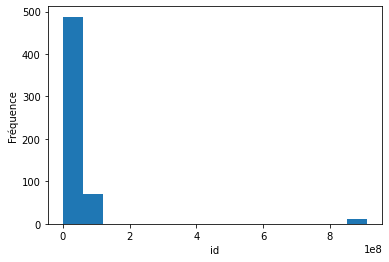

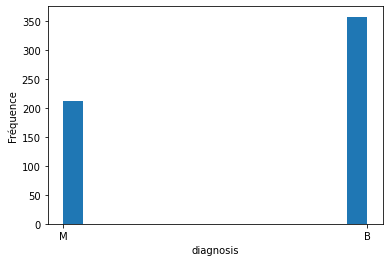

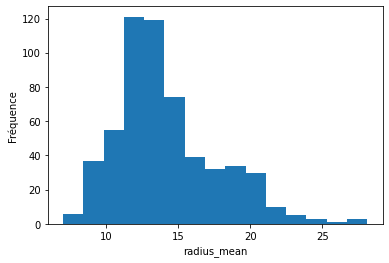

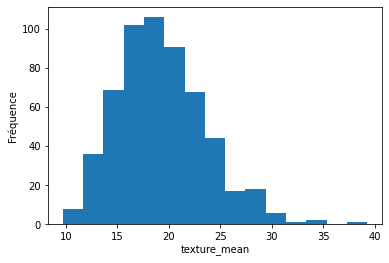

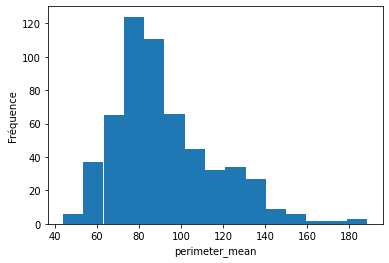

...

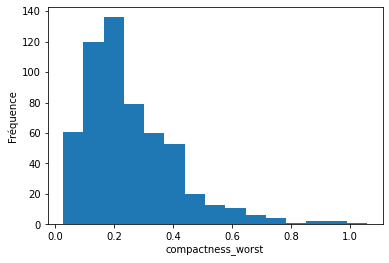

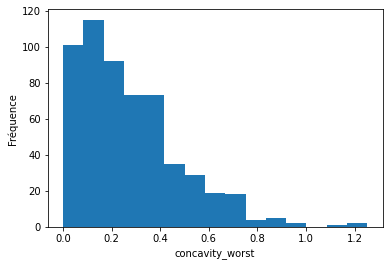

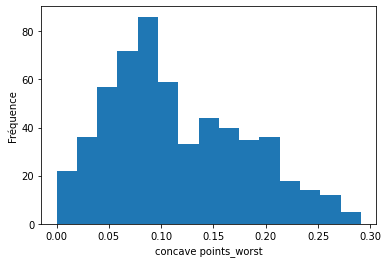

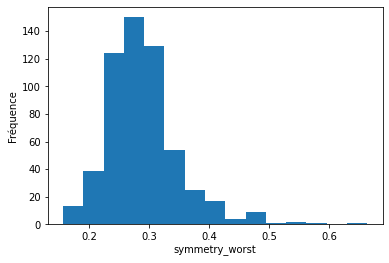

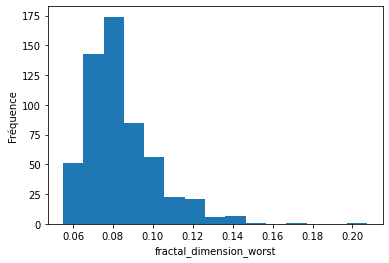

In [86]:
data_features  = data.drop("id", axis=1).drop("diagnosis", axis=1)

#A titre purement indicatif, on trace quelques graphes de répartition des valeurs.
#Cela permet aussi de visualiser l'existence éventuelle de valeurs extremes.

for c in data.columns:
    plt.figure()               # On construit un nouveau dessin
    plt.hist(data[c],bins=15)    # On regroupe les valeurs de la colonne 'c' par plage de largeur 15
    plt.xlabel(c)              # On donne le nom de l'attribut pour l'abscisse
    plt.ylabel('Fréquence')    # On nomme l'axe des ordonnées "Fréquence"
    plt.show()                 # On demande l'affichage

Notre étude va se porter sur les relations entre caractéristiques et diagnostics.

Par notre étude précédente, on a remarqué que les données diagnostics sont considérées comme des objets à valeur B ou M (bénigne, maligne).

On utilise donc le LabelEncoder pour passer à du binaire dans notre cas (B = 0, M = 1).

In [87]:
le = LabelEncoder()
data_labels = le.fit_transform(data['diagnosis'])

**C'est ici pour pouvoir modifier les tailles des groupes.**

In [88]:
#0,3 pour préciser que 30% seront pour l'ensemble de test et 70% pour l'entrainement
X_train, X_test, y_train, y_test = train_test_split(data_features,  data_labels,
                                                    test_size=0.3,
                                                    random_state=0)

On trace une matrice de corrélation pour visualiser de possibles relations

<AxesSubplot:>

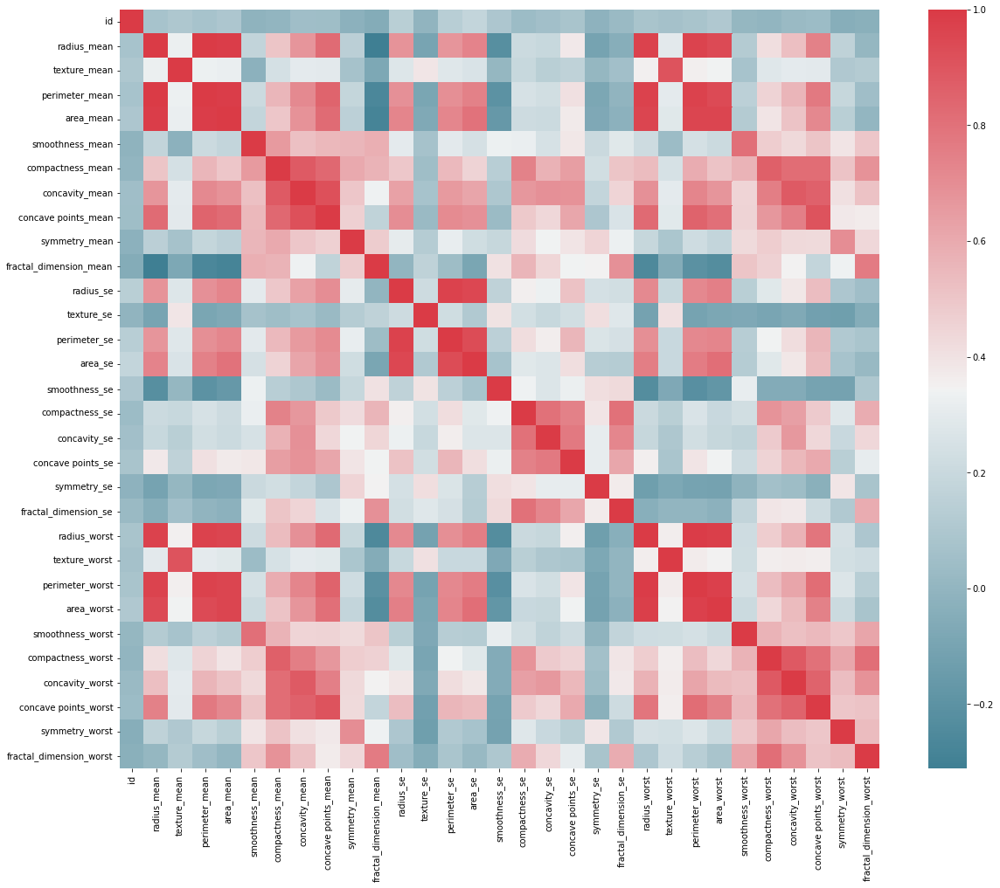

In [89]:
f, ax = plt.subplots(figsize=(20, 16))
corr = data.corr()
sb.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sb.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)


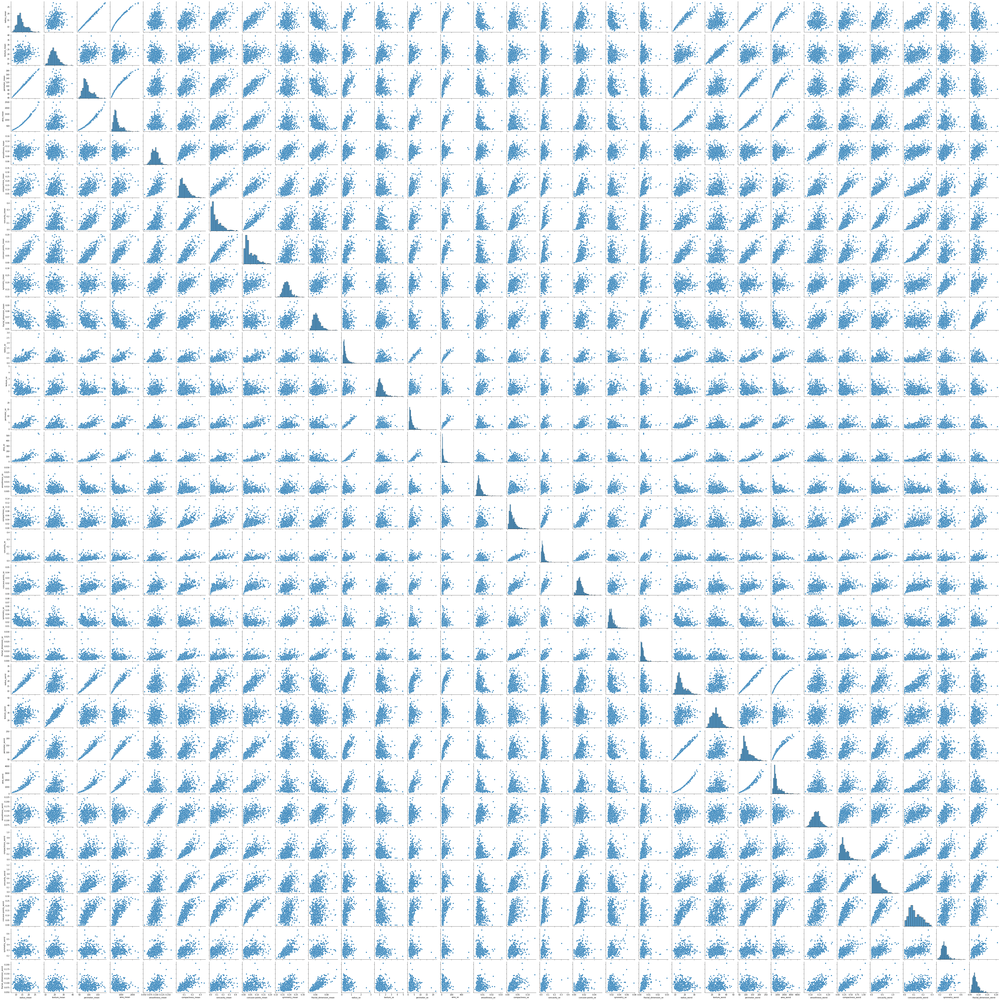

In [31]:
#On peut aussi utiliser cette fonction (plus long)
sb.pairplot(data)

In [90]:
#On vérifie si les ensembles ont des statistiques similaires
X_test.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,...,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000
mean,13.991813,19.514971,91.116082,638.666667,0.096093,0.104948,0.088811,0.047617,0.182241,0.063149,...,16.058713,26.009357,106.156082,848.780702,0.131995,0.256351,0.280702,0.113174,0.292144,0.084476
std,3.350407,4.552707,23.215732,315.631146,0.014441,0.056895,0.083486,0.037904,0.025905,0.007513,...,4.518309,6.148606,31.585168,496.934138,0.022525,0.166040,0.241050,0.066006,0.058172,0.018343
min,7.729000,10.720000,47.980000,178.800000,0.065760,0.033980,0.000000,0.000000,0.120300,0.050240,...,8.964000,12.490000,57.170000,242.200000,0.084090,0.046190,0.000000,0.000000,0.160300,0.058650
25%,11.640000,16.690000,74.220000,415.700000,0.085095,0.059845,0.025760,0.018785,0.164000,0.057940,...,12.805000,21.545000,84.020000,495.150000,0.116850,0.135450,0.103750,0.061815,0.254700,0.071500
50%,13.400000,19.040000,86.870000,551.100000,0.094910,0.089950,0.055000,0.030990,0.180900,0.061000,...,15.050000,25.780000,99.310000,697.700000,0.129700,0.208900,0.199200,0.102500,0.284900,0.079440
75%,15.900000,22.090000,103.750000,795.500000,0.104450,0.134700,0.135450,0.068600,0.196250,0.066780,...,18.655000,30.360000,124.650000,1060.000000,0.146800,0.342850,0.392700,0.162100,0.316950,0.092130
max,23.210000,39.280000,153.500000,1670.000000,0.163400,0.345400,0.426400,0.182300,0.290600,0.095020,...,31.010000,44.870000,206.800000,2944.000000,0.190200,0.932700,1.252000,0.291000,0.544000,0.144600


In [91]:
X_train.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,...,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,14.185500,19.192839,92.335503,661.859045,0.096475,0.104080,0.088794,0.049479,0.180698,0.062646,...,16.359621,25.534523,107.736030,894.246985,0.132529,0.253369,0.268531,0.115221,0.289187,0.083718
std,3.598618,4.190476,24.769334,366.558262,0.013916,0.051031,0.078154,0.039216,0.028057,0.006861,...,4.965170,6.147466,34.460647,597.853882,0.022989,0.153653,0.193250,0.065688,0.063439,0.017957
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.710000,16.032500,75.310000,420.350000,0.086740,0.066805,0.030385,0.020710,0.161525,0.057685,...,13.052500,20.865000,84.122500,516.425000,0.116300,0.148600,0.119100,0.065320,0.247850,0.071462
50%,13.310000,18.725000,86.140000,548.450000,0.096035,0.094035,0.062650,0.033870,0.179150,0.061715,...,14.915000,25.155000,97.455000,682.000000,0.132250,0.216000,0.229850,0.098855,0.280950,0.080075
75%,15.772500,21.597500,104.475000,779.125000,0.105400,0.128750,0.128775,0.075022,0.195400,0.065735,...,19.005000,29.452500,125.775000,1093.250000,0.145275,0.328975,0.378750,0.161300,0.318275,0.091852
max,28.110000,33.810000,188.500000,2501.000000,0.144700,0.311400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.105000,0.290300,0.663800,0.207500


Les échantillons ont l'air similaire. On peut donc continuer et passer à l'analyse.

# Analyse

En se basant sur les valeurs de Diagnostics, on ne peut avoir que 2 clusters possibles (0 ou 1).

## Clustering par l'algorithme K-means

In [104]:
#repris du TP2.1
from sklearn.cluster import KMeans
km = KMeans(n_clusters=2, random_state=10)
km.fit(X_train)
print(km.labels_)

[0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 1 1 1 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0
 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0]


On affiche les différents clusters avec scatter, d'abord sans couleurs sur quelques caractéristiques, puis avec via colormap. On utilisera les variables mean, plus générales, ainsi que perimeter, area et radius_worst.

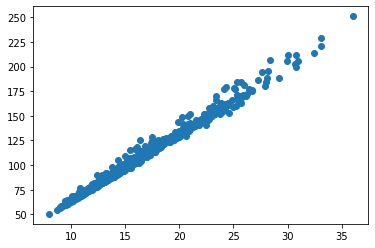

In [105]:
plt.scatter(data_features.radius_worst,data_features.perimeter_worst)

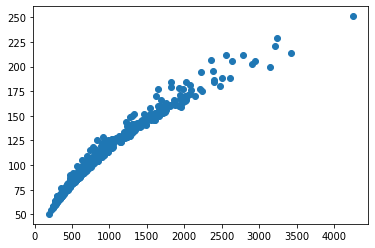

In [106]:
plt.scatter(data_features.area_worst,data_features.perimeter_worst)

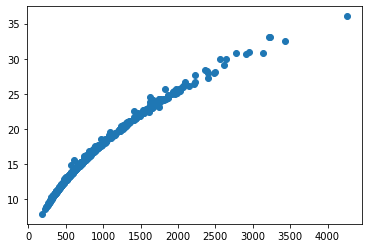

In [107]:
plt.scatter(data_features.area_worst,data_features.radius_worst)

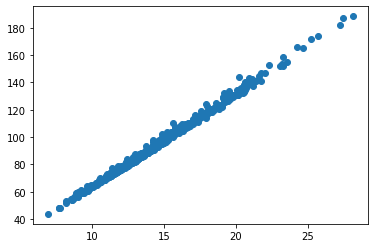

In [108]:
plt.scatter(data_features.radius_mean,data_features.perimeter_mean)

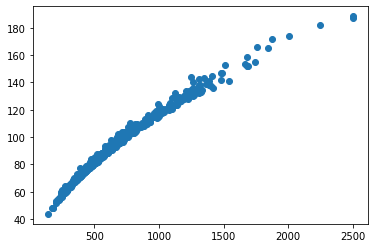

In [109]:
plt.scatter(data_features.area_mean,data_features.perimeter_mean)

On remarque une ligne beaucoup moins courbée entre le périmètre et le rayon (ce qui est normal). On prendra donc les valeurs worst et mean de ces derniers.

In [110]:
colormap=np.array(['magenta','cyan','yellow'])
#le rgb c'est surfait

On continue d'appliquer notre kmeans, mais avec des graphiques en couleur (toujours en suivant la méthode du TP2)

Text(0.5, 1.0, 'Clustering réel')

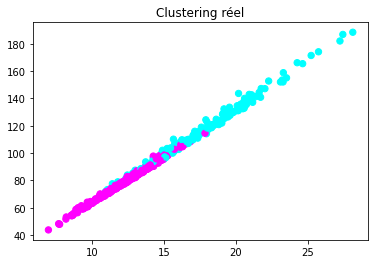

In [111]:
#Visualisation des clusters réels
plt.scatter(data_features.radius_mean,data_features.perimeter_mean,
            c=colormap[data_diag],s=40)
plt.title('Clustering réel')

Text(0.5, 1.0, 'Clustering réel')

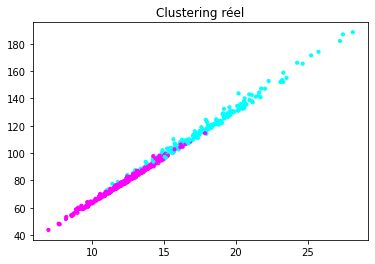

In [112]:
#En réduisant s
plt.scatter(data_features.radius_mean,data_features.perimeter_mean,
            c=colormap[data_diag],s=10)
plt.title('Clustering réel')

Text(0.5, 1.0, 'Clustering prédit')

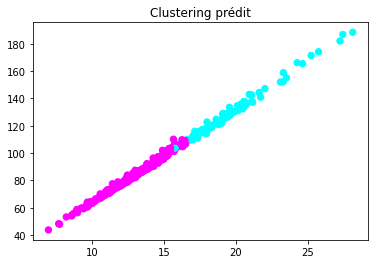

In [113]:
plt.scatter(X_train.radius_mean, X_train.perimeter_mean,
            c=colormap[km.labels_],s=40)
plt.title('Clustering prédit')

Les centroids des graphes plus haut se devinent assez vite. On recommence l'expérience pour d'autres caractéristiques, ici la texture, la smoothness et la compacité.

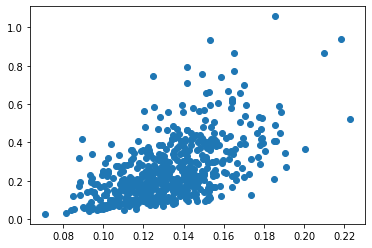

In [114]:
plt.scatter(data_features.smoothness_worst,data_features.compactness_worst)

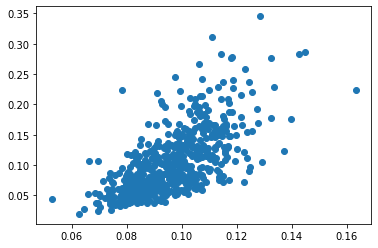

In [115]:
plt.scatter(data_features.smoothness_mean,data_features.compactness_mean)

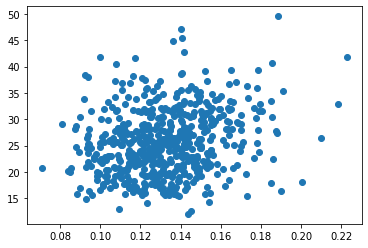

In [116]:
plt.scatter(data_features.smoothness_worst,data_features.texture_worst)

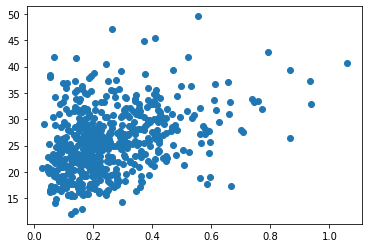

In [117]:
plt.scatter(data_features.compactness_worst,data_features.texture_worst)

Vu l'allure des graphiques, on ne pourra pas en tirer grand chose, on reste sur les dimensions du sein. Contrairement au TP 2, on n'a pas besoin de voir l'évolution des résultats selon le nombre de cluster ; 2 étant par défaut le meilleur. On passe donc directement à l'évaluation.

In [118]:
from sklearn.metrics import accuracy_score # Evaluation
print ('KNN accuracy score')
ypred = km.predict(X_test)
print (accuracy_score(y_test, ypred))

KNN accuracy score
0.8362573099415205


On va executer plusieurs tests à la suite (d'autant que notre Kmeans est particulièrement mauvais), on va donc stocker cette valeur dans un tableau récapitulatif.

In [132]:
scores = {}
scores['KNN_accuracy_score'] = accuracy_score(y_test, ypred)

## Méthode des K plus proches Voisins ( K nearest neighbors)

In [166]:
from sklearn.neighbors import KNeighborsClassifier # le classifieur
# Definir l'algorithme que je veux utiliser (KNN) avec le paramètre k=3
mon_knn = KNeighborsClassifier(n_neighbors=3)

#fitting : Lancer l'apprentissage ( données,labels)
mon_knn.fit(X_train, y_train)#.values.ravel())
# Evaluer l'entrainement de mon modèle
train_score = mon_knn.score(X_train, y_train)
print('train score = ',train_score )
scores['K_neighbors_score'] = train_score

#ypred : contient les prédictions de l'ensemble de test
ypred = mon_knn.predict(X_test)
scores['K_neighbors_score_predict']  = mon_knn.score(X_test, y_test)

train score =  0.9522613065326633


/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


## Evaluation du modèle par validation croisée

In [135]:
from sklearn.model_selection import cross_val_score

crossscores = cross_val_score(mon_knn, X_train, y_train, cv=5)
#scores = cross_val_score(mon_knn, df_features, df_labels, cv=5)
crossscores

/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/home/angom/.local/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


array([0.925     , 0.9125    , 0.9125    , 0.93670886, 0.94936709])

Il y a plusieurs visions possibles ici : prendre la valeur minimale, la moyenne, la médiane, etc. On ne va ici en tirer qu'une seule valeur

In [137]:
scores["val_croisees"] = crossscores.mean()
print(scores["val_croisees"])

0.9272151898734178


## Méthode des arbres de décision

In [138]:
#importer l'algorithme tree
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth=3)

#fitting : Lancer l'apprentissage ( données,labels)
clf.fit(X_train, y_train)

# Evaluer l'entrainement de mon modèle
train_score = clf.score(X_train, y_train)
print('train score = ',train_score )

#ypred : contient les prédictions de l'ensemble de teste
ypred = clf.predict(X_test)

print ('Decision tree accuracy score')
print (accuracy_score(y_test, ypred))

#On ajoute à notre tableau
scores["decision_tree_score_accuracy"] = accuracy_score(y_test, ypred)

train score =  0.9673366834170855
Decision tree accuracy score
0.9298245614035088


### Visu 1

[Text(167.4, 190.26, 'X[20] <= 16.795\ngini = 0.468\nsamples = 569\nvalue = [357, 212]'),
 Text(83.7, 135.9, 'X[27] <= 0.136\ngini = 0.159\nsamples = 379\nvalue = [346, 33]'),
 Text(41.85, 81.53999999999999, 'X[13] <= 91.555\ngini = 0.03\nsamples = 333\nvalue = [328, 5]'),
 Text(20.925, 27.180000000000007, 'gini = 0.024\nsamples = 332\nvalue = [328, 4]'),
 Text(62.775000000000006, 27.180000000000007, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(125.55000000000001, 81.53999999999999, 'X[21] <= 25.67\ngini = 0.476\nsamples = 46\nvalue = [18, 28]'),
 Text(104.625, 27.180000000000007, 'gini = 0.332\nsamples = 19\nvalue = [15, 4]'),
 Text(146.475, 27.180000000000007, 'gini = 0.198\nsamples = 27\nvalue = [3, 24]'),
 Text(251.10000000000002, 135.9, 'X[21] <= 19.91\ngini = 0.109\nsamples = 190\nvalue = [11, 179]'),
 Text(209.25, 81.53999999999999, 'X[27] <= 0.145\ngini = 0.498\nsamples = 17\nvalue = [9, 8]'),
 Text(188.32500000000002, 27.180000000000007, 'gini = 0.0\nsamples = 9\nvalue = 

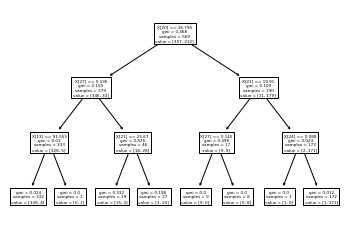

In [139]:
tree.plot_tree(clf.fit(data_features, data_labels),max_depth=3)

### Visu 2

In [140]:
from sklearn import tree
from sklearn.tree import export_text

algo_tree = tree.DecisionTreeClassifier(max_depth=3)
algo_tree = algo_tree.fit(data_features, data_labels)
r = export_text(clf , feature_names = data_features.columns.array)
print(r)

|--- radius_worst <= 16.80
|   |--- concave points_worst <= 0.14
|   |   |--- area_se <= 91.56
|   |   |   |--- class: 0
|   |   |--- area_se >  91.56
|   |   |   |--- class: 1
|   |--- concave points_worst >  0.14
|   |   |--- texture_worst <= 25.67
|   |   |   |--- class: 0
|   |   |--- texture_worst >  25.67
|   |   |   |--- class: 1
|--- radius_worst >  16.80
|   |--- texture_worst <= 19.91
|   |   |--- concave points_worst <= 0.15
|   |   |   |--- class: 0
|   |   |--- concave points_worst >  0.15
|   |   |   |--- class: 1
|   |--- texture_worst >  19.91
|   |   |--- smoothness_worst <= 0.09
|   |   |   |--- class: 0
|   |   |--- smoothness_worst >  0.09
|   |   |   |--- class: 1



**On continue sur différents algorithmes proposés lors du TP 2.2** :
* Régression Ridge
* Régression LASSO
* Régression Elastic Net
* Méthode de la RandomForest

## Régression Ridge

In [144]:
from sklearn.linear_model import Ridge
clf = Ridge()
clf.fit(X_train, y_train)
train_score = clf.score(X_train, y_train)
print('train score = ',train_score )

scores["regression_ridge"] = train_score

train score =  0.7490103517238926


## Régression LASSO

In [146]:
from sklearn.linear_model import Lasso
clf = Lasso()
clf.fit(X_train, y_train)
train_score = clf.score(X_train, y_train)
print('train score = ',train_score )

scores["regression_lasso"] = train_score

train score =  0.5519600429726201


## Régression Elastic net

In [148]:
from sklearn.linear_model import ElasticNet
clf = ElasticNet()
clf.fit(X_train, y_train)
train_score = clf.score(X_train, y_train)
print('train score = ',train_score )

scores["regression_elastic"] = train_score

train score =  0.6119940012668996


## Méthode Random Forest

In [150]:
from sklearn.ensemble import RandomForestRegressor

clf = RandomForestRegressor(max_depth=None, n_estimators=100)
clf.fit(X_train, y_train)# .values.ravel())

train_score = clf.score(X_train, y_train)
print('train score = ',train_score )

scores["random_forest"] = train_score

train score =  0.9777758928330773


**Autres méthodes de la doc scitkit** https://scikit-learn.org/stable/supervised_learning.html#supervised-learning
* Méthodes à base Naive Bayes https://scikit-learn.org/stable/modules/naive_bayes.html
* Méthodes à base Support Vector Machines https://scikit-learn.org/stable/modules/svm.html
* Méthodes à base linéaire https://scikit-learn.org/stable/modules/linear_model.html

## Méthodes Naive Bayes

### GaussianNB

In [152]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
scores["nb_gaussian_score"] = accuracy_score(y_test,y_pred)
print(scores["nb_gaussian_score"] )

0.9239766081871345


### MultinomialNB

In [153]:
from sklearn.naive_bayes import MultinomialNB
mnb = MultinomialNB()

y_pred = mnb .fit(X_train, y_train).predict(X_test)
scores["nb_multinomial_score"] = accuracy_score(y_test,y_pred)
print(scores["nb_multinomial_score"])

0.9005847953216374


## SVM

### LinearSVC

In [154]:
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

lscv = make_pipeline(StandardScaler(),LinearSVC())

y_pred = lscv.fit(X_train, y_train).predict(X_test)

scores['svm_linearSVC'] = accuracy_score(y_test,y_pred)

print(scores['svm_linearSVC'])

0.9415204678362573


### NuSVC 

In [155]:
from sklearn.svm import NuSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

nusvc = make_pipeline(StandardScaler(),NuSVC())

y_pred = nusvc.fit(X_train, y_train).predict(X_test)

scores['svm_nuSVC'] = accuracy_score(y_test,y_pred)

print(scores['svm_nuSVC'])

0.9298245614035088


## Linear

### HuberRegressor

In [157]:
#Ne fonctionne pas
#from sklearn.linear_model import HuberRegressor

#hr = HuberRegressor()
#y_pred = hr.fit(X_train, y_train).predict(X_test)
#scores["linear_huber"] = accuracy_score(y_test,y_pred)

#print(scores["linear_huber"] )

### Perceptron

In [159]:
from sklearn.linear_model import Perceptron

p = Perceptron()
y_pred = p.fit(X_train, y_train).predict(X_test)
scores["linear_perceptron"] = accuracy_score(y_test,y_pred)

print(scores["linear_perceptron"])

0.9064327485380117


### PassiveAggressiveClassifier

In [160]:
from sklearn.linear_model import PassiveAggressiveClassifier

pac = PassiveAggressiveClassifier()
y_pred = pac.fit(X_train, y_train).predict(X_test)
scores["linear_passiveaggressive"] = accuracy_score(y_test,y_pred)

print(scores["linear_passiveaggressive"] )

0.8713450292397661


### QuantileRegressor 

In [162]:
#Ne fonctionne pas
#from sklearn.linear_model import QuantileRegressor

#qr = QuantileRegressor()
#y_pred = qr.fit(X_train, y_train).predict(X_test)
#scores["linear_quantileregressor"] = accuracy_score(y_test,y_pred)

#print(scores["linear_quantileregressor"] )

### ARDRegression

In [164]:
#Ne fonctionne pas
#rom sklearn.linear_model import ARDRegression

#ard = ARDRegression()
#y_pred = ard.fit(X_train, y_train).predict(X_test)
#scores["linear_ard"] = accuracy_score(y_test,y_pred)

# Conclusion analyse

In [167]:
scores

{'KNN_accuracy_score': 0.9181286549707602,
 'K_neighbors_score': 0.9522613065326633,
 'K_neighbors_score_predict': 0.9181286549707602,
 'val_croisees': 0.9272151898734178,
 'decision_tree_score_accuracy': 0.9298245614035088,
 'regression_ridge': 0.7490103517238926,
 'regression_lasso': 0.5519600429726201,
 'regression_elastic': 0.6119940012668996,
 'random_forest': 0.9777758928330773,
 'nb_gaussian_score': 0.9239766081871345,
 'nb_multinomial_score': 0.9005847953216374,
 'svm_linearSVC': 0.9415204678362573,
 'svm_nuSVC': 0.9298245614035088,
 'linear_perceptron': 0.9064327485380117,
 'linear_passiveaggressive': 0.8713450292397661}

In [168]:
#Court code trouvé sur Internet pour avoir automatique la max d'un tableau à index
print(list(scores.keys())[list(scores.values()).index(max(scores.values()))])
print(max(scores.values()))

random_forest
0.9777758928330773


On a une probabilité assez élevée (<2.5%, mon objectif personnel était <5%), ce qui est très bon normalement.